## 1. IMPORT PYTHON LIBRARIES

In [1]:
import pandas as pd
import numpy as np

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
from dython.nominal import associations
import plotly.express as px
import plotly.graph_objects as go

from sklearn.preprocessing import StandardScaler, normalize
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

from pandas_profiling import ProfileReport

#### 2.  PERFORM EXPLORATORY DATA ANALYSIS
#### 3. Split the dataset into 2 datasets
#### 4. Calculate SUMMARY STATISTICS
#### 5. COLUMNS/FEATURES SCALLING using MinMaxScaler method
#### 6. DATA VISUALIZATION - Plot Correlation & Associations
#### 7. DATA VISUALIZATION - DISTRIBUTION / HISTOGRAM
#### 8. DATA VISUALIZATION - BOXPLOTS
#### 9. DATA VISUALIZATION - Plot columns in pairs
#### 10. OUTLIER DETECTION & TREATMENT
#### 11. COMBINE COLUMNS / FEATURES
#### 12. Implement a ML Clustering Algorithm: KMeans & PCA (Principal Component Analysis)

#### BACKUP

## 2.  PERFORM EXPLORATORY DATA ANALYSIS

### 2.1 Import CPVi dataset

In [2]:
CPVi = pd.read_excel('CFO CPVi Raw Data Summer School v2.xlsx')
CPVi.sample(10)

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date
3712,80120,Telecom Argentina,LAT,LAT SOUTHERN CONE,LAT SOUTHERN CONE CBT,n.a.,Argentina,Phone 2,Level 3,n.a.,Decision Maker,Finance & Procurement,Head of Procurement,Huawei,0.0562,0.0879,0.0245,0.6871,0.6871,0.6871,6,6,5,7,8.0,8.0,8.0,8.0,"Thursday, September 29, 2016",301001461,2017-09-09 00:00:00
2243,96104,Vivo,LAT,LAT BRA,LAT BRA CBT,Telefonica,Brazil,Phone 2,Level 4,n.a.,Influencer,Technical design & Implementation,New Technologies Manager,Huawei,0.8401,0.8727,0.8076,0.6708,0.5341,0.8076,9,9,8,9,8.0,8.0,8.0,9.0,"Thursday, August 2, 2018",301000410,2018-06-18 00:00:00
4488,78390,Sky Brasil,LAT,LAT BRA,LAT BRA CBT,n.a.,Brazil,Face to Face,Level 3,n.a.,Influencer,Technical design & Implementation,"Sr. Director Core Engineering, DirecTV Latam",Huawei,0.4970,0.5533,0.4406,0.9550,0.9519,0.9580,6,7,6,6,8.0,9.0,9.0,9.0,"Friday, October 16, 2015",301004622,2017-09-21 00:00:00
7050,20490,SoftBank,APJ,APJ JPN,APJ JPN CBT,Softbank,Japan,Face to Face,Level 2,n.a.,Decision Maker,"Operations, Managed Services & Maintenance",Head of Platform Operations Division,Ericsson,0.5484,0.4405,0.6564,0.7563,0.6564,0.8562,7,6,8,7,8.0,7.0,9.0,8.0,"Saturday, October 15, 2011",301002233,2020-10-11 00:00:00
5394,82993,Vodacom Tanzania,MEA,MEA SAV,MEA SAV CBT VF MEA,Vodafone,"Tanzania, United Republic of",Face to Face,Level 3,Anonymous,Influencer,Finance & Procurement,Anonymous,Huawei,0.6176,0.5900,0.6451,0.7694,0.7487,0.7901,8,7,9,7,8.0,8.0,9.0,8.0,"Friday, June 13, 2014",301000899,2018-06-02 00:00:00
5722,78848,Zain Iraq,MEA,MEA ME,MEA ME CBT ZAIN,Zain,Iraq,Phone 2,Level 3,n.a.,Influencer,Technical design & Implementation,Director Implementation,Huawei,0.3978,0.4793,0.3162,0.7569,0.7569,0.7569,7,7,6,7,8.0,8.0,8.0,8.0,"Sunday, December 1, 2013",301002845,2018-11-12 00:00:00
269,95862,Wind Tre,EUR,EUR MED,EUR MED CBT WindTre,Hutchison,Italy,VC,Level 2,COO,Influencer,"Operations, Managed Services & Maintenance",Head of Technology Operations,Huawei,0.5251,0.5251,0.5251,0.9773,0.9773,0.9773,8,7,8,7,9.0,9.0,9.0,9.0,"Thursday, March 25, 2021",301000714,2021-03-05 00:00:00
1277,84718,Spark New Zealand,APJ,APJ OCE,APJ OCE CBT New Zealand,n.a.,New Zealand,Face to Face,Level 2,CTO,Decision Maker,"Operations, Managed Services & Maintenance",Technology Lead,Cisco,0.5197,0.4425,0.5970,0.4224,0.2478,0.5970,8,7,8,8,7.0,7.0,8.0,8.0,"Monday, September 23, 2019",301006500,2019-09-16 00:00:00
374,96219,Telmex Mexico,LAT,LAT NORTHERN CONE,LAT NORTHERN CONE CBT,Carso,Mexico,VC,Level 3,Anonymous,Influencer,Technical design & Implementation,Anonymous,Huawei,0.6551,0.6551,0.6551,0.4602,0.5591,0.3614,8,9,8,9,9.0,8.0,8.0,8.0,"Thursday, December 3, 2020",301003072,2020-11-05 00:00:00
6347,61974,Vodafone India,INDIA,INDIA VFI,INDIA VFI CBT,Vodafone,India,Face to Face,Level 2,n.a.,Decision Maker,"Operations, Managed Services & Maintenance","Hub CTO, North India",Ericsson,0.6165,0.4024,0.8307,0.3261,0.2498,0.4024,7,8,7,9,7.0,7.0,7.0,8.0,"Friday, December 7, 2012",301000852,2019-11-21 00:00:00


### 2.2 Data Shape

In [3]:
CPVi.shape

(7708, 31)

### 2.3 Data Type

In [4]:
CPVi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7708 entries, 0 to 7707
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   cuseid                           7708 non-null   int64  
 1   Customer                         7708 non-null   object 
 2   Market                           7708 non-null   object 
 3   MU/GCBT                          7708 non-null   object 
 4   CBT                              7708 non-null   object 
 5   Int. account                     7708 non-null   object 
 6   Country                          7708 non-null   object 
 7   Type of interview                7708 non-null   object 
 8   Mgt. Level                       7708 non-null   object 
 9   Persona                          7708 non-null   object 
 10  Powermap                         7708 non-null   object 
 11  Working area                     7708 non-null   object 
 12  Job title           

### 2.4 Replace the rows containing invalid dates: '2/29/2017' & '2/29/2019'

In [5]:
CPVi = CPVi.replace(['2/29/2017','2/29/2019'],['2/28/2017', '2/28/2019'])

# indexNames = CPVi[(CPVi['Interview date']=='2/29/2017') | (CPVi['Interview date']=='2/29/2019')].index
# CPVi.drop(indexNames , inplace=True)

In [6]:
CPVi.shape

(7708, 31)

### 2.5 Convert some dtype 'object' columns to 'date'

In [7]:
# CPVi['Interview date'] = pd.to_datetime(CPVi['Interview date'], format= '%d/%m/%Y')
cols = ['Published','Interview date']
CPVi[cols] = CPVi[cols].apply(pd.to_datetime)

In [8]:
CPVi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7708 entries, 0 to 7707
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   cuseid                           7708 non-null   int64         
 1   Customer                         7708 non-null   object        
 2   Market                           7708 non-null   object        
 3   MU/GCBT                          7708 non-null   object        
 4   CBT                              7708 non-null   object        
 5   Int. account                     7708 non-null   object        
 6   Country                          7708 non-null   object        
 7   Type of interview                7708 non-null   object        
 8   Mgt. Level                       7708 non-null   object        
 9   Persona                          7708 non-null   object        
 10  Powermap                         7708 non-null   object     

In [9]:
CPVi.sample(10)

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date
4369,76478,TIM Brasil,LAT,LAT BRA,LAT BRA CBT,TIM,Brazil,Face to Face,Level 4,n.a.,Influencer,Company & Product Strategy,Innovation & Partnership Manager,Huawei,0.0672,0.0252,0.1092,0.1638,0.2185,0.1092,5,5,6,7,7.0,6.0,6.0,7.0,2015-11-12,301000190,2017-10-15
1827,95702,Vodacom RSA,MEA,MEA SAV,MEA SAV CBT VF MEA,Vodafone,South Africa,Face to Face,Level 3,n.a.,Decision Maker,Others,"Managing Executive, FN",Huawei,0.7998,0.9378,0.6618,0.2070,0.0153,0.3987,8,9,8,8,5.0,4.0,8.0,4.0,2018-11-06,301001399,2018-10-19
607,51150,TIM Italy,EUR,EUR MED,EUR MED CBT TIM,TIM,Italy,VC,Level 2,CTO - VP Fixed,Decision Maker,Technical design & Implementation,Deputy Chief Operating Officer,Huawei,0.5871,0.5117,0.6624,0.1510,0.2570,0.0451,8,8,7,9,7.0,8.0,6.0,7.0,2020-10-09,301000863,2020-09-04
749,84160,CUC Shanghai,GCHN,GCHN CUC,GCHN CUC CBT,CUC,China,VC,Level 3,CIO/CTIO,Decision Maker,Company & Product Strategy,VGM of Network Planning & Construction,Huawei,0.1776,0.0860,0.2693,0.5805,0.8242,0.3369,7,7,8,7,9.0,9.0,8.0,8.0,2020-06-24,301000090,2020-06-18
1902,84854,Orange Poland,EUR,EUR OR,EUR OR CBT Europe East,Orange,Poland,Face to Face,Level 3,n.a.,Influencer,Finance & Procurement,"Deputy Director, Purchasing",Huawei,0.2735,0.0502,0.4967,0.4846,0.3698,0.5993,5,6,9,5,7.0,7.0,9.0,7.0,2018-10-25,301000640,2018-10-02
4856,80120,Telecom Argentina,LAT,LAT SOUTHERN CONE,LAT SOUTHERN CONE CBT,n.a.,Argentina,Phone 2,Level 3,n.a.,Decision Maker,Finance & Procurement,Head of Procurement,Ericsson,0.4002,0.5000,0.3005,0.3005,0.3005,0.3005,8,7,7,7,7.0,7.0,7.0,7.0,2015-04-10,301001461,2017-03-11
6272,78432,Telia Company,EUR,EUR NBB,EUR NBB CBT Telia,TELIA,Sweden,Phone 2,Level 3,n.a.,Influencer,Technical design & Implementation,"Head of Core Network Development, Mobility",Ericsson,0.0918,0.0918,0.0918,0.5564,0.6543,0.4585,6,6,6,6,8.0,8.0,7.0,8.0,2013-03-27,301002903,2018-03-18
799,96711,TELUS,NAM,NAM CA,NAM CA CBT,n.a.,Canada,VC,Level 3,COO - VP Mobile Operations,Decision Maker,"Operations, Managed Services & Maintenance","Director, Wireless Services Development & Operations, Technology Strategy",Ericsson,0.9596,0.9560,0.9632,0.9596,0.9560,0.9632,8,9,9,9,8.0,9.0,9.0,9.0,2020-06-15,301002268,2020-05-15
5280,83036,CMCC Inner Mongolia,GCHN,GCHN CMCC,GCHN CMCC CBT,CMCC,China,Face to Face,Level 3,n.a.,Influencer,"Operations, Managed Services & Maintenance",Senior Manager Network Department,Huawei,0.1784,0.1784,0.1784,0.9076,0.9076,0.9076,7,7,7,7,9.0,9.0,9.0,9.0,2014-09-09,301000077,2018-08-12
3431,85225,SMART / PLDT,APJ,APJ SEA,APJ SEA CBT Philippines,PLDT,Philippines,Face to Face,Level 2,n.a.,Decision Maker,Finance & Procurement,CPO,Huawei,0.1381,0.0002,0.2760,0.2480,0.0322,0.4637,3,4,7,3,5.0,6.0,8.0,6.0,2016-11-10,301002172,2017-11-02


### 2.6 Create aditional 'Year' column

In [10]:
CPVi['Year'] = pd.DatetimeIndex(CPVi['Interview date']).year

In [11]:
CPVi.sample(10)

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date,Year
5554,82866,Alfa,MEA,MEA ME,MEA ME CBT GROWTH,n.a.,Lebanon,Phone 2,Level 3,n.a.,Influencer,Technical design & Implementation,Head of Implementation,Ericsson,0.9180,0.8360,1.0000,0.1441,0.0478,0.2405,8,9,9,10,5.0,5.0,7.0,1.0,2014-04-15,301002764,2018-04-03,2018
6478,78210,Bakcell,EUR,EUR CECA,EUR CECA CBT CASPIAN,n.a.,Azerbaijan,Phone 2,Level 3,n.a.,Influencer,Technical design & Implementation,Head of PMO,Huawei,0.4339,0.4037,0.4641,0.5729,0.4342,0.7116,7,5,7,6,6.0,7.0,9.0,7.0,2012-10-11,301003005,2019-10-05,2019
4203,31519,T-Mobile Netherlands,EUR,EUR DT,EUR DT CBT NORTH,DT,Netherlands,Phone 2,Level 4,n.a.,Influencer,Technical design & Implementation,Team Leader VAS TD&D,Huawei,0.6677,0.8408,0.4946,0.5014,0.4946,0.5081,8,8,7,7,7.0,7.0,8.0,6.0,2016-03-01,301000682,2017-02-02,2017
5376,78574,Hi3G,EUR,EUR NBB,EUR NBB CBT Nordics & Baltics,Hutchison,Sweden,Phone 2,Level 3,n.a.,Decision Maker,Company & Product Strategy,Head of Networks,Ericsson,0.8165,0.8003,0.8327,0.8003,0.8003,0.8003,8,8,9,8,8.0,8.0,8.0,8.0,2014-07-01,301002917,2018-06-10,2018
3191,95432,Vivo,LAT,LAT BRA,LAT BRA CBT,Telefonica,Brazil,Phone 2,Level 4,n.a.,Influencer,Technical design & Implementation,Access Network Planning Manager,Huawei,0.7871,0.5742,1.0000,0.6440,0.4386,0.8495,8,8,8,10,8.0,7.0,8.0,9.0,2017-05-04,301000410,2017-04-20,2017
2335,96036,DTAC,APJ,APJ THA,APJ THA CBT Thailand,Telenor,Thailand,Face to Face,Level 3,n.a.,Influencer,Finance & Procurement,Head of Category Management Technology Unit,Ericsson,0.6133,0.5407,0.6858,0.4687,0.4000,0.5373,8,7,8,8,6.0,8.0,9.0,6.0,2018-06-04,301000435,2018-05-22,2018
6747,77969,Orange Spain,EUR,EUR OR,EUR OR CBT Europe West,Orange,Spain,Face to Face,Level 4,n.a.,Influencer,Finance & Procurement,Manager Budget Planning,Huawei,0.0439,0.0448,0.0431,0.7051,0.5338,0.8764,5,5,5,4,7.0,7.0,8.0,8.0,2012-05-03,301000629,2019-04-18,2019
481,97867,Vivo,LAT,LAT BRA,LAT BRA CBT,Telefonica,Brazil,VC,Level 2,CDO,Decision Maker,Others,Data and Artificial Intelligence Director,Microsoft,0.5098,0.4983,0.5213,0.5308,0.1892,0.8725,8,8,9,7,7.0,6.0,10.0,9.0,2020-11-09,301000410,2020-10-13,2020
2992,83124,AIS,APJ,APJ THA,APJ THA CBT Thailand,SingTel,Thailand,Face to Face,Level 4,n.a.,Influencer,Finance & Procurement,Technical Investment Planning,Huawei,0.3734,0.4772,0.2696,0.8521,0.7426,0.9617,8,7,7,7,9.0,8.0,9.0,9.0,2017-08-03,301000433,2017-07-17,2017
1602,71779,Telefonica Peru,LAT,LAT SOUTHERN CONE,LAT SOUTHERN CONE CBT,Telefonica,Peru,Face to Face,Level 3,CTO - VP Mobile,Decision Maker,Technical design & Implementation,Planning & Engineering Director,Huawei,0.5444,0.3348,0.7540,0.9104,0.8910,0.9299,7,8,7,9,8.0,9.0,9.0,9.0,2019-04-12,301000403,2019-03-14,2019


### 2.7 Checking for missing values

In [12]:
CPVi.isnull().sum()

cuseid                               0
Customer                             0
Market                               0
MU/GCBT                              0
CBT                                  0
Int. account                         0
Country                              0
Type of interview                    0
Mgt. Level                           0
Persona                              0
Powermap                             0
Working area                         0
Job title                            0
Competitor                           0
CPV Nokia                            0
CPV Nokia Experience                 0
CPV Nokia Expectation                0
CPV Competitor                       0
CPV Competitor Experience           38
CPV Competitor Expectation         192
Value perception Nokia               0
Overall satisfaction Nokia           0
Strategic fit with Nokia             0
Recommendation Nokia                 0
Value perception competitor         34
Overall satisfaction comp

### 2.8 Replace missing values by the Mean/Average of that column

In [13]:
CPVi.fillna(CPVi.mean(), inplace=True)

<ipython-input-13-38545bfa47eb>:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  CPVi.fillna(CPVi.mean(), inplace=True)
<ipython-input-13-38545bfa47eb>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  CPVi.fillna(CPVi.mean(), inplace=True)


In [14]:
CPVi.isnull().sum()

cuseid                             0
Customer                           0
Market                             0
MU/GCBT                            0
CBT                                0
Int. account                       0
Country                            0
Type of interview                  0
Mgt. Level                         0
Persona                            0
Powermap                           0
Working area                       0
Job title                          0
Competitor                         0
CPV Nokia                          0
CPV Nokia Experience               0
CPV Nokia Expectation              0
CPV Competitor                     0
CPV Competitor Experience          0
CPV Competitor Expectation         0
Value perception Nokia             0
Overall satisfaction Nokia         0
Strategic fit with Nokia           0
Recommendation Nokia               0
Value perception competitor        0
Overall satisfaction competitor    0
Strategic fit with competitor      0
R

## 3. Split the dataset into 2 datasets:
#### - one with categorical variables
#### - and a second one with numerical variables

In [15]:
categorical = CPVi.select_dtypes(include=['object']).columns.tolist()

In [16]:
CPVi_categorical = pd.DataFrame(CPVi, columns = categorical)
CPVi_categorical.sample(10)

,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor
1028,Vodafone Spain,EUR,EUR VF,EUR VF CBT IB,Vodafone,Spain,Face to Face,Level 4,CTO,Influencer,"Operations, Managed Services & Maintenance",Fixed Networks Engineering Manager,Huawei
989,Elisa,EUR,EUR NBB,EUR NBB CBT Elisa,n.a.,Finland,Face to Face,Level 2,CTO - VP Fixed,Influencer,Finance & Procurement,"Head of Fixed Technology, Nokia Vendor Manager",Huawei
7572,CUC Heilongjiang,GCHN,GCHN CUC,GCHN CUC CBT,CUC,China,Face to Face,n.a.,n.a.,Influencer,"Operations, Managed Services & Maintenance",Wireless Network Optimization,Huawei
4298,NTT DOCOMO,APJ,APJ JPN,APJ JPN CBT,n.a.,Japan,Face to Face,Level 4,n.a.,Influencer,"Operations, Managed Services & Maintenance","Manager, Network Service Operation Dept.",NEC
4335,NTT DOCOMO,APJ,APJ JPN,APJ JPN CBT,n.a.,Japan,Face to Face,Level 3,n.a.,Decision Maker,Technical design & Implementation,"Director, RAN Development Dept.",NEC
7162,E-Plus,EUR,EUR TEF,EUR TEF CBT DE,Telefonica,Germany,Phone 2,Level 3,n.a.,Influencer,"Operations, Managed Services & Maintenance","Dep. Mgr., Operations",ZTE
3205,CTC Anhui,GCHN,GCHN CTC,GCHN CTC CBT,CTC,China,Face to Face,Level 3,n.a.,Influencer,Company & Product Strategy,VGM Network Development Department,Huawei
598,Antel Uruguay,LAT,LAT SOUTHERN CONE,LAT SOUTHERN CONE CBT,n.a.,Uruguay,Phone 2,Level 4,Anonymous,Decision Maker,Technical design & Implementation,Anonymous,Ericsson
2049,everything everywhere,EUR,EUR UI,EUR UI CBT BT,British Telecom,United Kingdom,Face to Face,Level 2,n.a.,Decision Maker,Technical design & Implementation,"Director, NW Architecture & Design",Huawei
3554,COX,NAM,NAM US MA,NAM US MA CBT,n.a.,United States,Face to Face,Level 4,n.a.,Influencer,Finance & Procurement,"Executive Director, Strategic Sourcing",Cisco


In [17]:
numerical = CPVi.select_dtypes(exclude=['object']).columns.tolist()

In [18]:
CPVi_numerical = pd.DataFrame(CPVi, columns = numerical)
CPVi_numerical.sample(10)

,cuseid,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date,Year
2310,83342,0.9018,0.9018,0.9018,0.5126,0.8247,0.2005,9,9,9,9,8.0,9.0,7.0,8.0,2018-06-04,301000709,2018-05-30,2018
3734,41937,0.5890,0.6871,0.4908,0.8174,0.9476,0.6871,8,8,7,8,8.0,9.0,8.0,8.0,2016-09-29,301001461,2017-09-06,2017
3790,84139,0.5025,0.4543,0.5508,0.6738,0.6315,0.7162,7,6,8,6,7.0,7.0,8.0,7.0,2016-09-02,301002174,2017-08-17,2017
2161,84952,0.9168,0.9168,0.9168,0.3975,0.3975,0.3975,9,9,9,9,8.0,8.0,8.0,8.0,2018-09-06,301000645,2018-08-06,2018
4784,51150,0.6604,0.5632,0.7575,0.1844,0.1844,0.1844,8,8,7,9,7.0,7.0,7.0,7.0,2015-05-08,301000863,2017-04-15,2017
903,31376,0.1384,0.2113,0.0654,0.2113,0.2113,0.2113,7,7,6,7,7.0,7.0,7.0,7.0,2020-06-15,301000403,2020-03-18,2020
1297,96251,0.4531,0.3386,0.5677,0.1416,0.2213,0.0618,7,8,8,8,7.0,7.0,6.0,6.0,2019-09-16,301003173,2019-09-07,2019
3630,84165,0.1400,0.2115,0.0685,0.3254,0.2499,0.4009,7,6,6,6,7.0,7.0,8.0,6.0,2016-11-02,301003173,2017-09-22,2017
880,96866,0.8281,0.6561,1.0000,0.9392,0.8784,1.0000,9,8,9,10,9.0,9.0,9.0,10.0,2020-05-14,301006162,2020-04-13,2020
4580,78506,1.0000,1.0000,1.0000,0.2281,0.0595,0.3966,10,10,10,10,6.0,7.0,9.0,5.0,2015-08-11,301001748,2017-07-16,2017


## 4. Calculate SUMMARY STATISTICS

### 4.1 Summary Statistics for numerical dataset

In [19]:
(CPVi_numerical.describe().applymap(lambda x: f"{x:0.1f}"))

,cuseid,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,SAP ID,Year
count,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0
mean,71505.3,0.6,0.6,0.6,0.6,0.6,0.6,7.6,7.5,7.4,7.7,7.7,7.7,7.8,7.7,301001758.9,2018.4
std,24573.9,0.3,0.3,0.3,0.3,0.3,0.3,1.3,1.3,1.5,1.6,1.2,1.1,1.2,1.3,2905.6,1.3
min,1013.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,301000027.0,2017.0
25%,61600.0,0.3,0.3,0.3,0.4,0.4,0.4,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,301000433.0,2017.0
50%,78609.0,0.6,0.6,0.6,0.6,0.6,0.6,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,301000995.0,2018.0
75%,84829.0,0.8,0.8,0.9,0.8,0.8,0.8,8.0,8.0,8.0,9.0,9.0,8.0,9.0,9.0,301002719.0,2019.0
max,103318.0,1.0,1.0,1.0,1.0,1.0,1.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,301038062.0,2021.0


### 4.2 Summary Statistics for categorical dataset

In [20]:
print(CPVi_categorical.describe(include='all').transpose())

                  count unique                                top  freq
Customer           7708    257                                AIS    88
Market             7708      7                                EUR  2558
MU/GCBT            7708     45                  LAT SOUTHERN CONE   540
CBT                7708    105              LAT SOUTHERN CONE CBT   540
Int. account       7708     47                               n.a.  1674
Country            7708     86                              China   766
Type of interview  7708      3                       Face to Face  4799
Mgt. Level         7708      7                            Level 3  3996
Persona            7708     32                               n.a.  5646
Powermap           7708      5                         Influencer  3808
Working area       7708      6  Technical design & Implementation  2388
Job title          7708   4478                          Anonymous   527
Competitor         7708     73                             Huawe

## 5. COLUMNS/FEATURES SCALLING using MinMaxScaler method
https://en.wikipedia.org/wiki/Feature_scaling#Rescaling_(min-max_normalization)

In [21]:
mms = MinMaxScaler()

In [22]:
CPVi[['Value perception Nokia','Overall satisfaction Nokia', 'Strategic fit with Nokia', 'Recommendation Nokia','Value perception competitor','Overall satisfaction competitor','Strategic fit with competitor','Recommendation competitor']] = mms.fit_transform(CPVi[['Value perception Nokia','Overall satisfaction Nokia', 'Strategic fit with Nokia', 'Recommendation Nokia','Value perception competitor','Overall satisfaction competitor','Strategic fit with competitor','Recommendation competitor']]).round(2)

In [23]:
CPVi.sample(10)

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date,Year
4785,20561,CMCC Fujian,GCHN,GCHN CMCC,GCHN CMCC CBT,CMCC,China,Face to Face,Level 3,n.a.,Decision Maker,Finance & Procurement,Head of Procurement Department,Huawei,0.4390,0.4390,0.4390,0.8603,0.8603,0.8603,0.78,0.78,0.78,0.78,0.89,0.89,0.89,0.89,2015-05-01,301000056,2017-04-14,2017
6886,61257,T-Mobile Czech/Slovak Telekom,EUR,EUR DT,EUR DT CBT NORTH,DT,Czechia,Face to Face,Level 3,n.a.,Influencer,"Operations, Managed Services & Maintenance",Head of Infrastructure Dept.,Huawei,0.2969,0.3334,0.2603,0.6162,0.7342,0.4981,0.56,0.67,0.56,0.56,0.78,0.78,0.78,0.56,2011-12-21,301000615,2020-12-07,2020
401,97950,Bharti,INDIA,INDIA BHARTI,INDIA BHARTI CBT,Bharti,India,VC,Level 4,CTO - VP Mobile,Influencer,Technical design & Implementation,"DGM, Planning",Ericsson,0.8356,0.8743,0.7970,0.2972,0.4937,0.1006,0.89,0.89,0.78,0.89,0.78,0.78,0.56,0.78,2020-11-20,301002200,2020-11-03,2020
7222,41900,MTS Russia,EUR,EUR EE,EUR EE CBT SIS,Sistema,Russian Federation,Phone 2,Level 1,n.a.,Ultimate Decision Maker,Company & Product Strategy,VP and CEO of MTS Group,Huawei,0.8468,0.7489,0.9446,0.8683,0.9446,0.7920,0.78,0.78,0.78,0.89,0.78,0.89,0.89,0.78,2011-06-21,301002891,2020-06-16,2020
4066,84341,Korea Telecom,APJ,APJ KOR,APJ KOR CBT,n.a.,"Korea, Republic of",Face to Face,Level 4,n.a.,Influencer,"Operations, Managed Services & Maintenance","Sr. Manager, NW Construction",Samsung,0.9301,1.0000,0.8602,0.5573,0.7874,0.3271,0.89,1.00,0.89,0.89,0.78,0.89,0.67,0.78,2016-06-01,301003335,2017-04-27,2017
1532,96673,Etisalat UAE,MEA,MEA ME,MEA ME CBT GULF,Etisalat,United Arab Emirates,Face to Face,Level 3,CMO - Consumer PLM,Decision Maker,Technical design & Implementation,"VP, Customer Exp. & Femto",Huawei,0.5371,0.3889,0.6854,0.5664,0.5819,0.5509,0.78,0.56,0.89,0.78,0.78,0.78,0.89,0.67,2019-05-21,301002865,2019-04-30,2019
4526,78719,Indosat,APJ,APJ IDS,APJ IDS CBT,Ooredoo,Indonesia,Face to Face,Level 3,n.a.,Influencer,Technical design & Implementation,Group Head of Planning,Ericsson,0.6640,0.3281,1.0000,0.0007,0.0014,0.0000,0.67,0.67,0.67,1.00,0.33,0.56,0.22,0.33,2015-09-16,301000371,2017-09-10,2017
1465,95951,Lumen,NAM,NAM US MA,NAM US MA CBT,n.a.,United States,Phone 2,Level 3,Anonymous,Influencer,Technical design & Implementation,Anonymous,Ciena,0.8150,0.6844,0.9456,0.5897,0.4951,0.6844,0.78,0.78,0.78,0.89,0.78,0.67,0.78,0.78,2019-07-11,301002335,2019-06-12,2019
2290,96116,Vodafone Spain,EUR,EUR VF,EUR VF CBT IB,Vodafone,Spain,Face to Face,Level 4,n.a.,Influencer,"Operations, Managed Services & Maintenance",Suppliers & Sharing Performance Manager,Huawei,0.1759,0.2494,0.1024,0.6371,0.6371,0.6371,0.67,0.56,0.56,0.56,0.78,0.78,0.78,0.78,2018-07-04,301000832,2018-06-05,2018
7501,76534,Orange HQ,EUR,EUR OR,EUR OR CBT France,Orange,France,Face to Face,Level 3,n.a.,Influencer,"Operations, Managed Services & Maintenance","Head of Operations, Emerging Markets Technical Support",Ericsson,0.8836,0.7969,0.9703,0.1261,0.1948,0.0574,0.78,0.78,0.78,0.89,0.56,0.56,0.44,0.44,2010-12-18,301001402,2021-11-22,2021


In [24]:
categorical = CPVi.select_dtypes(include=['object']).columns.tolist()
CPVi_categorical = pd.DataFrame(CPVi, columns = categorical)

In [25]:
numerical = CPVi.select_dtypes(exclude=['object']).columns.tolist()
CPVi_numerical = pd.DataFrame(CPVi, columns = numerical)

## 6. DATA VISUALIZATION - Plot Correlation & Associations

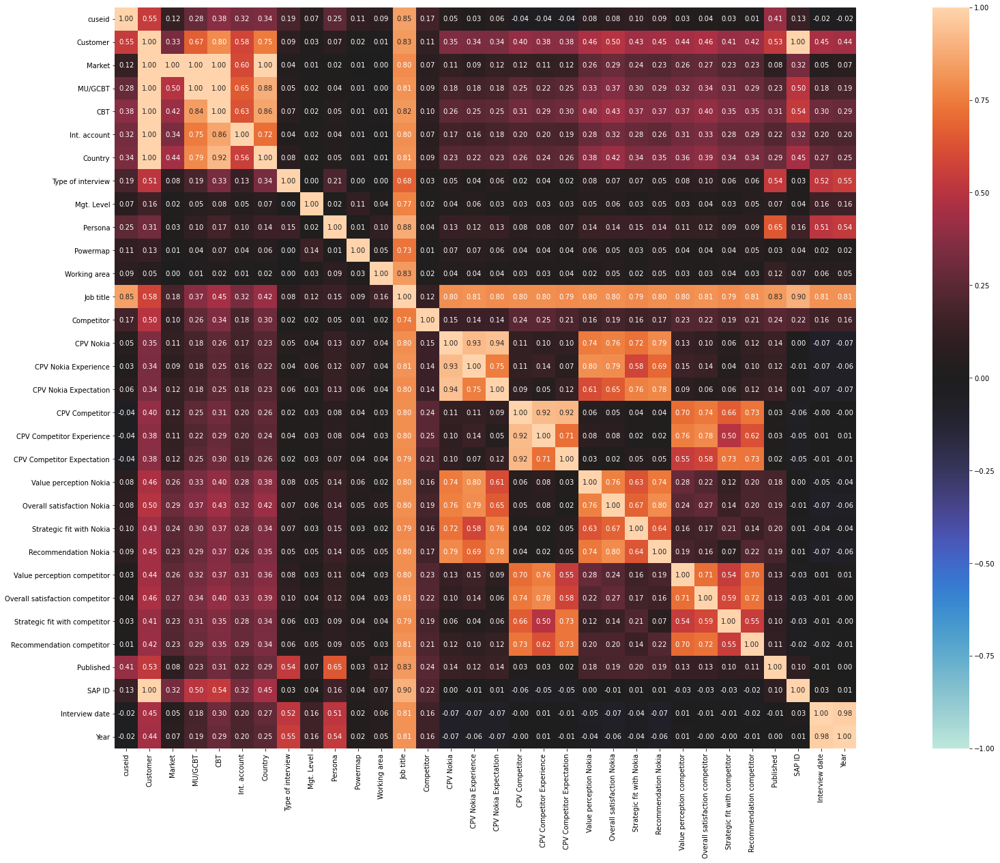

{'corr':                                    cuseid  Customer    Market   MU/GCBT  \
 cuseid                           1.000000  0.545969  0.122135  0.284572   
 Customer                         0.545969  1.000000  0.332221  0.666121   
 Market                           0.122135  1.000000  1.000000  1.000000   
 MU/GCBT                          0.284572  1.000000  0.498740  1.000000   
 CBT                              0.380151  1.000000  0.417618  0.837346   
 Int. account                     0.324558  1.000000  0.343087  0.746660   
 Country                          0.336245  1.000000  0.444281  0.788398   
 Type of interview                0.192767  0.514730  0.081313  0.193312   
 Mgt. Level                       0.072163  0.156361  0.015376  0.050443   
 Persona                          0.250575  0.306154  0.029260  0.103587   
 Powermap                         0.108162  0.126765  0.013052  0.036248   
 Working area                     0.086310  0.050561  0.002140  0.011042   
 Job

In [26]:
associations(CPVi, nom_nom_assoc='theil', figsize=(40, 20), cmap=None, cbar=True)

In [27]:
CPVi_categorical.columns

Index(['Customer', 'Market', 'MU/GCBT', 'CBT', 'Int. account', 'Country',
       'Type of interview', 'Mgt. Level', 'Persona', 'Powermap',
       'Working area', 'Job title', 'Competitor'],
      dtype='object')

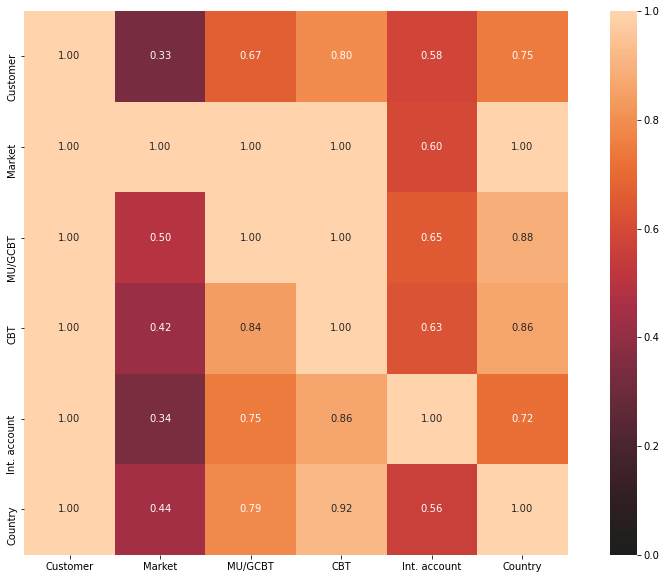

{'corr':               Customer    Market   MU/GCBT       CBT  Int. account   Country
 Customer           1.0  0.332221  0.666121  0.795514      0.581956  0.745935
 Market             1.0  1.000000  1.000000  1.000000      0.600991  0.997544
 MU/GCBT            1.0  0.498740  1.000000  1.000000      0.652319  0.882864
 CBT                1.0  0.417618  0.837346  1.000000      0.629159  0.862648
 Int. account       1.0  0.343087  0.746660  0.860039      1.000000  0.716429
 Country            1.0  0.444281  0.788398  0.919984      0.558936  1.000000,
 'ax': <AxesSubplot:>}

In [28]:
associations(CPVi[['Customer', 'Market', 'MU/GCBT', 'CBT', 'Int. account', 'Country']], nom_nom_assoc='theil', figsize=(15, 10), cmap=None, cbar=True,)

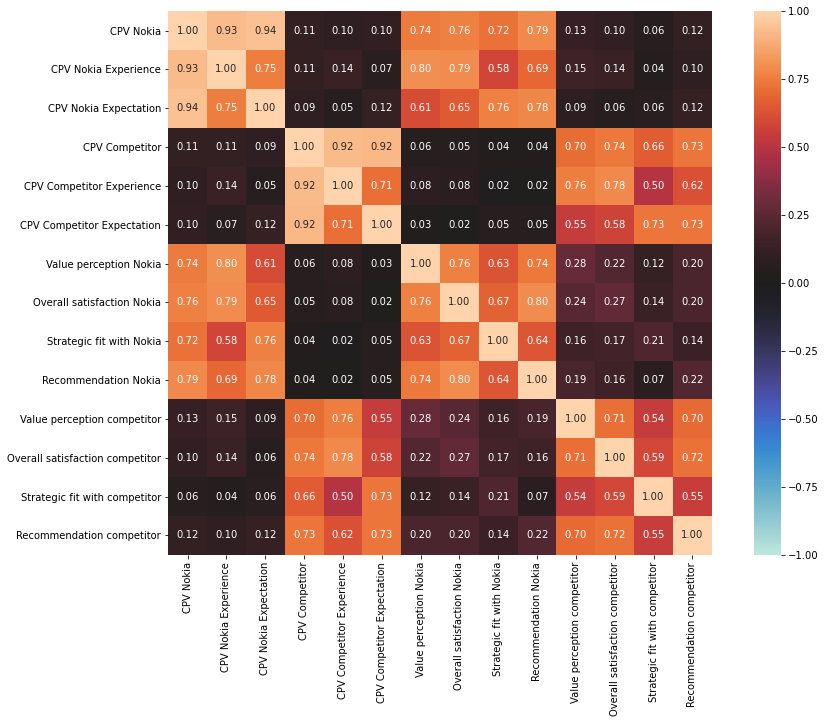

{'corr':                                  CPV Nokia  CPV Nokia Experience  \
 CPV Nokia                         1.000000              0.928449   
 CPV Nokia Experience              0.928449              1.000000   
 CPV Nokia Expectation             0.944218              0.754327   
 CPV Competitor                    0.110174              0.112911   
 CPV Competitor Experience         0.099704              0.139231   
 CPV Competitor Expectation        0.101706              0.069179   
 Value perception Nokia            0.744125              0.798967   
 Overall satisfaction Nokia        0.764439              0.791433   
 Strategic fit with Nokia          0.721107              0.580870   
 Recommendation Nokia              0.787152              0.689822   
 Value perception competitor       0.125516              0.154252   
 Overall satisfaction competitor   0.102312              0.136796   
 Strategic fit with competitor     0.055710              0.039402   
 Recommendation competitor

In [29]:
associations(CPVi[['CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation',
       'CPV Competitor', 'CPV Competitor Experience',
       'CPV Competitor Expectation', 'Value perception Nokia',
       'Overall satisfaction Nokia', 'Strategic fit with Nokia',
       'Recommendation Nokia', 'Value perception competitor',
       'Overall satisfaction competitor', 'Strategic fit with competitor',
       'Recommendation competitor']], nom_nom_assoc='pearson', figsize=(15, 10), cmap=None, cbar=True)

## 7. DATA VISUALIZATION - DISTRIBUTION / HISTOGRAM

In [30]:
CPVi_numerical.columns

Index(['cuseid', 'CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation',
       'CPV Competitor', 'CPV Competitor Experience',
       'CPV Competitor Expectation', 'Value perception Nokia',
       'Overall satisfaction Nokia', 'Strategic fit with Nokia',
       'Recommendation Nokia', 'Value perception competitor',
       'Overall satisfaction competitor', 'Strategic fit with competitor',
       'Recommendation competitor', 'Published', 'SAP ID', 'Interview date',
       'Year'],
      dtype='object')

In [31]:
len(CPVi_numerical.columns)

19

C:\Users\hancu\Anaconda3\envs\CiprianEnv\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\hancu\Anaconda3\envs\CiprianEnv\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\hancu\Anaconda3\envs\CiprianEnv\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with

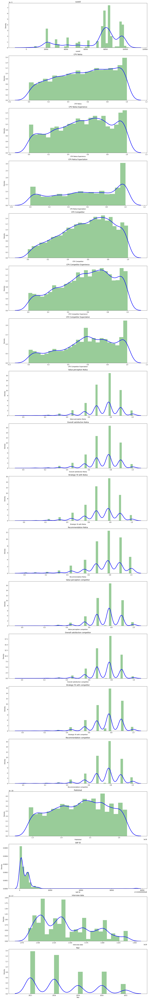

In [32]:
plt.figure(figsize=(15,100))
for i in range(len(CPVi_numerical.columns)):
  plt.subplot(19, 1, i+1)
  sns.distplot(CPVi_numerical[CPVi_numerical.columns[i]], kde_kws={"color": "b", "lw": 3, "label": "KDE"}, hist_kws={"color": "g"})
  plt.title(CPVi_numerical.columns[i])

plt.tight_layout()

In [33]:
# # Plot histogram for each continuous feature to see if a transformation is necessary
# for feature in ['CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation',
#        'CPV Competitor', 'CPV Competitor Experience',
#        'CPV Competitor Expectation', 'Value perception Nokia',
#        'Overall satisfaction Nokia', 'Strategic fit with Nokia',
#        'Recommendation Nokia', 'Value perception competitor',
#        'Overall satisfaction competitor', 'Strategic fit with competitor',
#        'Recommendation competitor']:
#     sns.distplot(CPVi[feature], kde=False)
#     plt.title('Histogram for {}'.format(feature))
#     plt.show()

## 8. DATA VISUALIZATION - BOXPLOTS

In [34]:
# plt.figure(figsize=(15,10))
# sns.boxplot( data = CPVi[['CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation',
#        'CPV Competitor', 'CPV Competitor Experience',
#        'CPV Competitor Expectation', 'Value perception Nokia',
#        'Overall satisfaction Nokia', 'Strategic fit with Nokia',
#        'Recommendation Nokia', 'Value perception competitor',
#        'Overall satisfaction competitor', 'Strategic fit with competitor',
#        'Recommendation competitor']], orient="h")
# plt.show()

In [35]:
y0 = CPVi['CPV Nokia']
y1 = CPVi['CPV Nokia Experience']
y2 = CPVi['CPV Nokia Expectation']
y3 = CPVi['CPV Competitor']
y4 = CPVi['CPV Competitor Experience']
y5 = CPVi['CPV Competitor Expectation']
y6 = CPVi['Value perception Nokia']
y7 = CPVi['Overall satisfaction Nokia']
y8 = CPVi['Strategic fit with Nokia']
y9 = CPVi['Recommendation Nokia']
y10 = CPVi['Value perception competitor']
y11 = CPVi['Overall satisfaction competitor']
y12 = CPVi['Strategic fit with competitor']
y13 = CPVi['Recommendation competitor']
fig = go.Figure()
fig.add_trace(go.Box(x=y0, quartilemethod="linear", name='CPV Nokia'))
fig.add_trace(go.Box(x=y1, quartilemethod="linear", name='CPV Nokia Experience'))
fig.add_trace(go.Box(x=y2, quartilemethod="linear", name='CPV Nokia Expectation'))
fig.add_trace(go.Box(x=y3, quartilemethod="linear", name='CPV Competitor'))
fig.add_trace(go.Box(x=y4, quartilemethod="linear", name='CPV Competitor Experience'))
fig.add_trace(go.Box(x=y5, quartilemethod="linear", name='CPV Competitor Expectation'))
fig.add_trace(go.Box(x=y6, quartilemethod="linear", name='Value perception Nokia'))
fig.add_trace(go.Box(x=y7, quartilemethod="linear", name='Overall satisfaction Nokia'))
fig.add_trace(go.Box(x=y8, quartilemethod="linear", name='Strategic fit with Nokia'))
fig.add_trace(go.Box(x=y9, quartilemethod="linear", name='Recommendation Nokia'))
fig.add_trace(go.Box(x=y10, quartilemethod="linear", name='Value perception competitor'))
fig.add_trace(go.Box(x=y11, quartilemethod="linear", name='Overall satisfaction competitor'))
fig.add_trace(go.Box(x=y12, quartilemethod="linear", name='Strategic fit with competitor'))
fig.add_trace(go.Box(x=y13, quartilemethod="linear", name='Recommendation competitor'))
fig.update_layout(title_text="Box Plot All Scores")
fig.show()

## 9. DATA VISUALIZATION - Plot columns in pairs

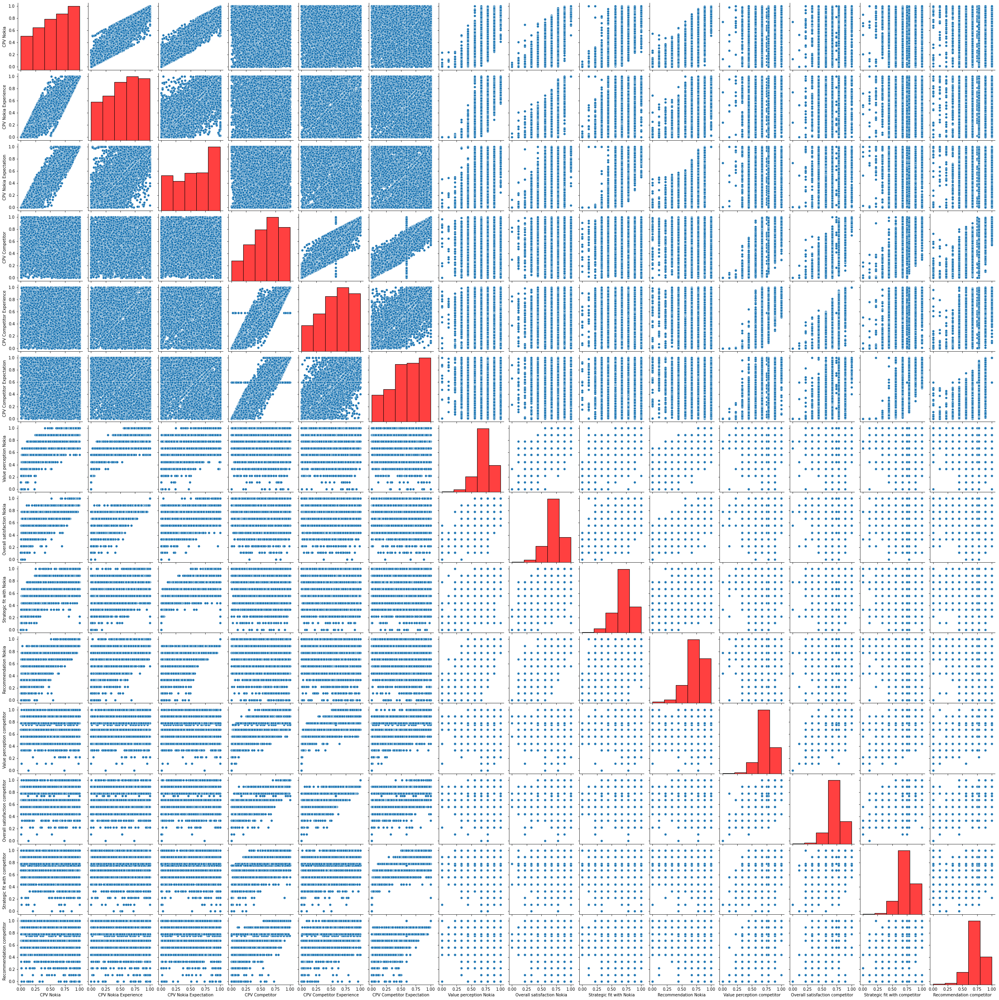

In [36]:
import seaborn as sns
sns.pairplot(CPVi[['CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation',
       'CPV Competitor', 'CPV Competitor Experience',
       'CPV Competitor Expectation', 'Value perception Nokia',
       'Overall satisfaction Nokia', 'Strategic fit with Nokia',
       'Recommendation Nokia', 'Value perception competitor',
       'Overall satisfaction competitor', 'Strategic fit with competitor',
       'Recommendation competitor']], diag_kws={'color':'red', 'bins':5})

Text(0, 0.5, 'CPV Nokia Experience')

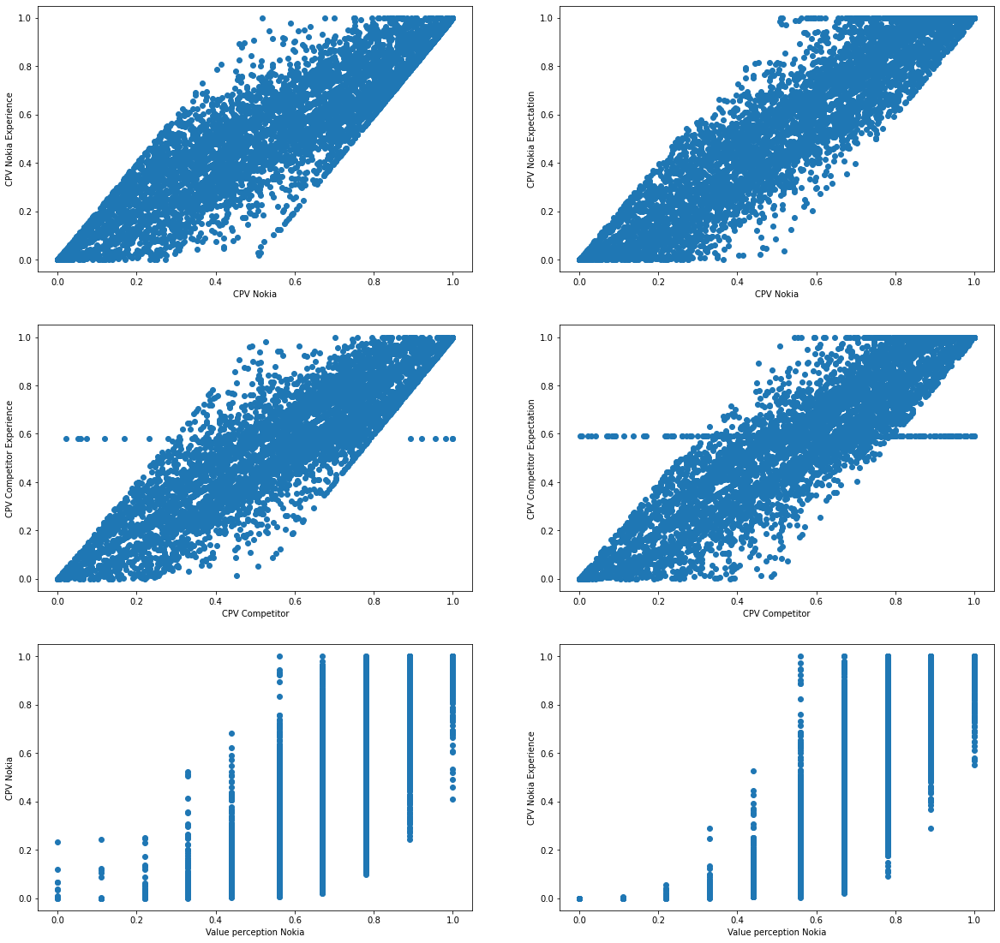

In [37]:
plt.figure(figsize=(20,40))

x1 = CPVi['CPV Nokia']
y1 = CPVi['CPV Nokia Experience']
plt.subplot(6,2,1)
plt.scatter(x1, y1)
plt.xlabel('CPV Nokia')
plt.ylabel('CPV Nokia Experience')

x2 = CPVi['CPV Nokia']
y2 = CPVi['CPV Nokia Expectation']
plt.subplot(6,2,2)
plt.scatter(x2, y2)
plt.xlabel('CPV Nokia')
plt.ylabel('CPV Nokia Expectation')

x3 = CPVi['CPV Competitor']
y3 = CPVi['CPV Competitor Experience']
plt.subplot(6,2,3)
plt.scatter(x3, y3)
plt.xlabel('CPV Competitor')
plt.ylabel('CPV Competitor Experience')

x4 = CPVi['CPV Competitor']
y4 = CPVi['CPV Competitor Expectation']
plt.subplot(6,2,4)
plt.scatter(x4, y4)
plt.xlabel('CPV Competitor')
plt.ylabel('CPV Competitor Expectation')

x5 = CPVi['Value perception Nokia']
y5 = CPVi['CPV Nokia']
plt.subplot(6,2,5)
plt.scatter(x5, y5)
plt.xlabel('Value perception Nokia')
plt.ylabel('CPV Nokia')

x6 = CPVi['Value perception Nokia']
y6 = CPVi['CPV Nokia Experience']
plt.subplot(6,2,6)
plt.scatter(x6, y6)
plt.xlabel('Value perception Nokia')
plt.ylabel('CPV Nokia Experience')

## 10. OUTLIER DETECTION & OUTLIER TREATMENT USING 1.5 IQR (1.5 INTER-QUARTILE RANGE)

### 10.1 Outliers detection for the column: 'Recommendation Nokia'

In [38]:
CPVi.sort_values('Recommendation Nokia', ascending=True, inplace=True, ignore_index = True)

In [39]:
def outlier_treatment(datacolumn):
    sorted(datacolumn)
    Q1,Q3 = np.percentile(datacolumn , [25,75])
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    return lower_range,upper_range

In [40]:
lowerbound,upperbound = outlier_treatment(CPVi['Recommendation Nokia'])
print('lower_range: ' + str(lowerbound.round(2)))
print('upper_range: ' + str(upperbound))

lower_range: 0.34
upper_range: 1.22


In [41]:
CPVi['Recommendation Nokia'][(CPVi['Recommendation Nokia'] < lowerbound)]

0      0.00
1      0.00
2      0.00
3      0.00
4      0.00
5      0.00
6      0.00
7      0.00
8      0.00
9      0.00
10     0.00
11     0.00
12     0.00
13     0.00
14     0.00
15     0.00
16     0.00
17     0.00
18     0.00
19     0.00
20     0.00
21     0.00
22     0.00
23     0.00
24     0.00
25     0.00
26     0.00
27     0.00
28     0.00
29     0.00
30     0.00
31     0.00
32     0.00
33     0.00
34     0.00
35     0.00
36     0.00
37     0.00
38     0.11
39     0.11
40     0.11
41     0.11
42     0.11
43     0.11
44     0.11
45     0.11
46     0.11
47     0.11
48     0.11
49     0.11
50     0.11
51     0.11
52     0.11
53     0.11
54     0.11
55     0.11
56     0.11
57     0.11
58     0.11
59     0.11
60     0.11
61     0.11
62     0.11
63     0.11
64     0.11
65     0.11
66     0.11
67     0.11
68     0.11
69     0.11
70     0.11
71     0.11
72     0.11
73     0.11
74     0.11
75     0.11
76     0.11
77     0.11
78     0.11
79     0.11
80     0.11
81     0.11
82     0.22
83  

In [42]:
CPVi_LowScore = CPVi.head(289)
CPVi_LowScore

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date,Year
0,76090,Turk Telekom,EUR,EUR CECA,EUR CECA CBT Turkey,Turk Telekom,Turkey,Face to Face,Level 4,n.a.,Decision Maker,Technical design & Implementation,Deputy Head of Networks,Alcatel-Lucent,0.0049,0.0009,0.0089,0.2141,0.1401,0.2882,0.22,0.33,0.33,0.00,0.56,0.56,0.67,0.56,2010-11-12,301003015,2021-11-11,2021
1,95734,everything everywhere,EUR,EUR UI,EUR UI CBT BT,British Telecom,United Kingdom,Phone 2,Level 3,n.a.,Decision Maker,"Operations, Managed Services & Maintenance","Programme Director, Strategic Programmes",Huawei,0.0000,0.0000,0.0000,0.8086,0.6866,0.9305,0.11,0.11,0.00,0.00,0.78,0.78,0.78,0.89,2017-10-16,301003825,2017-09-27,2017
2,76861,UScellular,NAM,NAM US MA,NAM US MA CBT,n.a.,United States,Face to Face,Level 3,n.a.,Influencer,"Operations, Managed Services & Maintenance","Sr. Director, National Network Operations",Ericsson,0.2693,0.4096,0.1290,0.6661,0.6661,0.6661,0.67,0.33,0.44,0.00,0.67,0.67,0.67,0.67,2015-10-05,301002265,2017-09-21,2017
3,76836,Shaw Communications,NAM,NAM CA,NAM CA CBT,n.a.,Canada,Phone 2,Level 4,n.a.,Influencer,Technical design & Implementation,"Manager, Telephony Infrastructure Systems",GENBAND,0.0930,0.0973,0.0887,0.8375,0.8375,0.8375,0.33,0.33,0.33,0.00,0.78,0.78,0.78,0.78,2011-06-02,301002290,2020-05-30,2020
4,83393,BT,EUR,EUR UI,EUR UI CBT BT,British Telecom,United Kingdom,Face to Face,Level 2,n.a.,Decision Maker,Technical design & Implementation,Chief Architect Officer,Alcatel-Lucent,0.0360,0.0000,0.0721,0.9667,0.9334,1.0000,0.00,0.33,0.33,0.00,0.89,0.89,0.89,1.00,2015-06-10,301001020,2017-05-14,2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284,78636,Salt,EUR,EUR WCE,EUR WCE CBT Iliad/NJJ,n.a.,Switzerland,Face to Face,Level 2,n.a.,Ultimate Decision Maker,Technical design & Implementation,CTO,Ericsson,0.1710,0.0007,0.3413,0.3092,0.5130,0.1054,0.22,0.33,0.67,0.33,0.67,0.67,0.44,0.67,2013-10-28,301000626,2018-10-11,2018
285,84169,Telefonica UK,EUR,EUR TEF,EUR TEF CBT UK,Telefonica,United Kingdom,Phone 2,Level 3,n.a.,Influencer,Company & Product Strategy,Head of Radio,Ericsson,0.0863,0.1344,0.0381,0.3443,0.2103,0.4783,0.56,0.33,0.44,0.33,0.56,0.67,0.78,0.56,2017-10-05,301001302,2017-09-25,2017
286,20349,Telkom,MEA,MEA SAV,MEA SAV CBT TELKOM,n.a.,South Africa,Face to Face,Level 2,n.a.,Decision Maker,Company & Product Strategy,"Senior Managing Executive, Wholesale and Networks",Huawei,0.2914,0.2328,0.3499,0.5939,0.6231,0.5647,0.56,0.44,0.67,0.33,0.78,0.67,0.56,0.78,2011-11-30,301002831,2020-11-24,2020
287,20349,Telkom,MEA,MEA SAV,MEA SAV CBT TELKOM,n.a.,South Africa,Face to Face,Level 3,n.a.,Ultimate Decision Maker,"Operations, Managed Services & Maintenance",Senior Managing Executive: Wholesale and Networks,Alcatel-Lucent,0.3102,0.4074,0.2130,0.4573,0.4074,0.5073,0.67,0.56,0.56,0.33,0.67,0.56,0.67,0.67,2010-11-23,301002831,2021-11-16,2021


### 10.2 List of Customers who rated a lower score than entire population

In [43]:
CPVi_LowScore['Customer'].unique()

array(['Turk Telekom', 'everything everywhere', 'UScellular',
       'Shaw Communications', 'BT', 'Sky Brasil', 'Telefonica Panama',
       'SFR', 'Orange Poland', 'Orange France', 'Vodacom Tanzania',
       'STC Saudi', 'Telenor Sweden', 'TELUS', 'MegaFon',
       'Deutsche Telekom AG', 'Claro Colombia', 'Mobily', 'StarHub',
       'Optus', 'Vodafone Ukraine', 'Tigo Colombia', 'Vodafone UK',
       'Telenor Denmark', 'Claro Ecuador', 'T-Mobile Polska',
       'Nextel Brazil', 'Zain Saudi Arabia', 'Claro Brasil',
       'T-Mobile Czech/Slovak Telekom', 'Charter', 'Zain Kuwait',
       'Telkom', 'T-Mobile Austria', 'Proximus', 'Maxis Malaysia', 'du',
       'Celcom', 'Swisscom', 'Zain Iraq', 'TeliaSonera Finland', 'LG U+',
       'Korea Telecom', 'Oi Brasil', 'T-Mobile Netherlands', 'BuyIn',
       'CTC Jiangsu', 'Telefonica Ecuador', 'Telmex Mexico', 'SK Telecom',
       'Orange HQ', 'Vodacom RSA', '3 Ireland', 'NuevaTel', 'KDDI', 'AIS',
       'Telefonica Corporate', 'H3I', 'Ooredoo H

### 10.3 Outliers detection using 3 alternative solutions:
- data points that lie anywhere between 5% and 95% percentile of the dataset
- 3 standard deviations below/above the mean
- data points that lie anywhere between 1% and 99% percentile of the datasete

In [44]:
def detect_outlier(feature):
    outliers = []
    data = CPVi[feature]
    mean = np.mean(data)
    std =np.std(data)
    
    
    for y in data:
        z_score= (y - mean)/std
        if np.abs(z_score) > 3:
            outliers.append(y)
    print('\nOutlier low for {}:'.format(feature))
    print('  --95p: {:.1f} / {} values exceed that'.format(data.quantile(.05),
                                                             len([i for i in data
                                                                  if i < data.quantile(.05)])))
    print('  --3sd: {:.1f} / {} values exceed that'.format(mean - 3*(std), len(outliers)))
    print('  --99p: {:.1f} / {} values exceed that'.format(data.quantile(.01),
                                                             len([i for i in data
                                                                  if i < data.quantile(.01)])))

In [45]:
for feat in ['Recommendation Nokia']:
    detect_outlier(feat)


Outlier low for Recommendation Nokia:
  --95p: 0.4 / 289 values exceed that
  --3sd: 0.2 / 82 values exceed that
  --99p: 0.1 / 38 values exceed that


In [46]:
CPVi_numerical.columns

Index(['cuseid', 'CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation',
       'CPV Competitor', 'CPV Competitor Experience',
       'CPV Competitor Expectation', 'Value perception Nokia',
       'Overall satisfaction Nokia', 'Strategic fit with Nokia',
       'Recommendation Nokia', 'Value perception competitor',
       'Overall satisfaction competitor', 'Strategic fit with competitor',
       'Recommendation competitor', 'Published', 'SAP ID', 'Interview date',
       'Year'],
      dtype='object')

## 11. COMBINE COLUMNS / FEATURES

### 11.1 Average Score Nokia

In [47]:
CPVi['AVG Score Nokia'] = CPVi[['CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation','Value perception Nokia',
                           'Overall satisfaction Nokia', 'Strategic fit with Nokia','Recommendation Nokia']].mean(axis=1)

### 11.2 Average Score Competitor

In [48]:
CPVi['AVG Score Competitor'] = CPVi[['CPV Competitor', 'CPV Competitor Experience','CPV Competitor Expectation', 
'Value perception competitor','Overall satisfaction competitor', 'Strategic fit with competitor','Recommendation competitor']].mean(axis=1)

In [49]:
CPVi.sample(10)

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date,Year,AVG Score Nokia,AVG Score Competitor
4771,41194,Orange France,EUR,EUR OR,EUR OR CBT France,Orange,France,VC,Level 2,CTO,Ultimate Decision Maker,Company & Product Strategy,CTO,Ericsson,0.6332,0.4499,0.8165,0.3358,0.4499,0.221700,0.67,0.67,0.78,0.78,0.67,0.67,0.56,0.67,2020-11-13,301000630,2020-09-30,2020,0.685657,0.511057
2501,52462,SFR,EUR,EUR WCE,EUR WCE CBT SFR,Altice,France,Face to Face,Level 1,n.a.,Decision Maker,Technical design & Implementation,Vice President Networks,Huawei,0.2701,0.2183,0.3219,0.2183,0.2183,0.592446,0.56,0.56,0.56,0.67,0.56,0.56,0.75,0.67,2011-04-08,301000834,2020-03-30,2020,0.451471,0.509864
7433,52707,CMCC Beijing,GCHN,GCHN CMCC,GCHN CMCC CBT,CMCC,China,Face to Face,Level 2,COO,Decision Maker,"Operations, Managed Services & Maintenance","VGM, NW Department",Ericsson,1.0000,1.0000,1.0000,0.0079,0.0139,0.001900,1.00,1.00,1.00,1.00,0.56,0.56,0.44,0.33,2019-07-04,301000052,2019-06-20,2019,1.000000,0.273386
1453,78797,Korea Telecom,APJ,APJ KOR,APJ KOR CBT,n.a.,"Korea, Republic of",Face to Face,Level 4,n.a.,Influencer,Technical design & Implementation,Manager Network Technology Unit,Ericsson,0.4130,0.5113,0.3148,0.2141,0.3148,0.113400,0.78,0.67,0.67,0.67,0.67,0.67,0.56,0.67,2013-09-16,301003335,2018-09-09,2018,0.575586,0.458900
5311,21360,Telenor Pakistan,MEA,MEA ME,MEA ME CBT Pakistan,Telenor,Pakistan,VC,Level 3,CTO - VP Mobile,Decision Maker,Technical design & Implementation,Head of Deployment,ZTE,0.9265,0.9153,0.9377,0.7607,0.8484,0.672900,0.78,0.89,0.89,0.89,0.67,0.89,0.78,0.78,2020-05-15,301002597,2020-05-04,2020,0.889929,0.771714
3900,82805,Viettel,APJ,APJ VNM,APJ VNM CBT,Viettel,Viet Nam,Face to Face,Level 3,Anonymous,Influencer,Technical design & Implementation,Anonymous,Huawei,0.4886,0.3165,0.6607,0.3996,0.3165,0.482700,0.67,0.67,0.78,0.78,0.67,0.67,0.67,0.78,2014-03-19,301000445,2018-03-03,2018,0.623686,0.569829
4033,84854,Orange Poland,EUR,EUR OR,EUR OR CBT Europe East,Orange,Poland,Face to Face,Level 2,CFO - Procurement,Decision Maker,Finance & Procurement,Deputy Purchasing Director,Huawei,0.6755,0.6755,0.6755,0.9375,0.9375,0.592446,0.78,0.78,0.78,0.78,0.89,0.89,0.89,0.75,2019-11-07,301000640,2019-10-16,2019,0.735214,0.841064
2844,72817,Orange France,EUR,EUR OR,EUR OR CBT France,Orange,France,Face to Face,Level 3,n.a.,Decision Maker,Technical design & Implementation,Deputy CTO,Ericsson,0.6162,0.7459,0.4865,0.4865,0.4865,0.486500,0.67,0.78,0.67,0.67,0.67,0.67,0.67,0.67,2018-10-08,301000630,2018-09-21,2018,0.662657,0.591357
2801,96234,AT&T Mexico,LAT,LAT NORTHERN CONE,LAT NORTHERN CONE CBT,AT&T,Mexico,Face to Face,Level 3,n.a.,Influencer,Others,IOT Director,Cisco,0.3064,0.2415,0.3714,0.7429,0.8428,0.642900,0.67,0.78,0.78,0.67,0.78,0.89,0.89,0.78,2018-10-05,301003125,2018-09-24,2018,0.545614,0.795514
4267,97481,Claro Brasil,LAT,LAT BRA,LAT BRA CBT,Carso,Brazil,Face to Face,Level 2,COO,Decision Maker,"Operations, Managed Services & Maintenance",Implementation Director,Huawei,0.4886,0.2945,0.6826,0.6345,0.5863,0.682600,0.67,0.67,0.89,0.78,0.78,0.78,0.89,0.78,2019-11-05,301001424,2019-10-17,2019,0.639386,0.733343


### 11.3 Scatterplot between: 'AVG Score Nokia' vs 'AVG Score Competitor'

<AxesSubplot:xlabel='AVG Score Nokia', ylabel='AVG Score Competitor'>

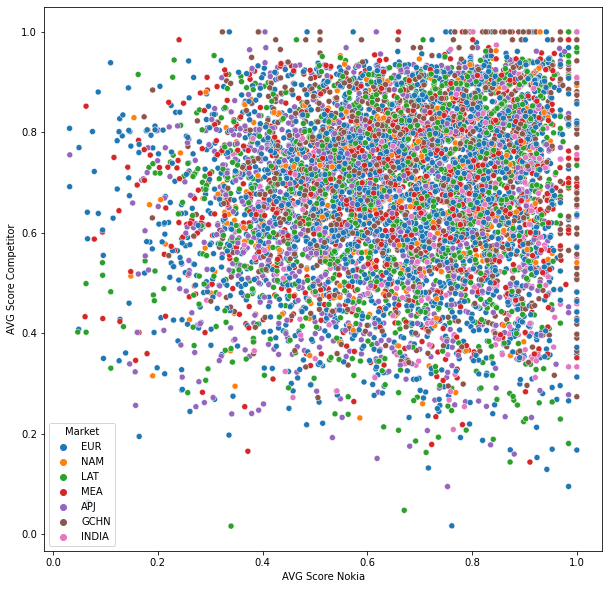

In [50]:
plt.figure(figsize=(10,10))
sns.scatterplot(x='AVG Score Nokia', y='AVG Score Competitor', hue = 'Market', data = CPVi)

### 11.4 Scatterplot between: 'AVG Score Nokia' vs 'AVG Score Competitor'

<AxesSubplot:>

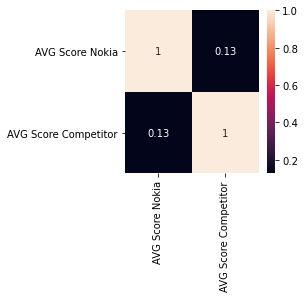

In [51]:
plt.figure(figsize=(3,3))
sns.heatmap(CPVi[['AVG Score Nokia', 'AVG Score Competitor']].corr(), annot=True)

### 11.5 Statistics comparison between: 'AVG Score Nokia' vs 'AVG Score Competitor'

In [52]:
print('AVG Score Nokia: ')
print(CPVi['AVG Score Nokia'].describe())
print("")
print('AVG Score Competitor: ')
print(CPVi['AVG Score Competitor'].describe())

AVG Score Nokia: 
count    7708.000000
mean        0.659277
std         0.194569
min         0.031429
25%         0.520182
50%         0.679600
75%         0.814311
max         1.000000
Name: AVG Score Nokia, dtype: float64

AVG Score Competitor: 
count    7708.000000
mean        0.679186
std         0.165738
min         0.015714
25%         0.569111
50%         0.694986
75%         0.804218
max         1.000000
Name: AVG Score Competitor, dtype: float64


### 11.6 Statistics comparison by Market between: 'AVG Score Nokia' vs 'AVG Score Competitor'

In [53]:
print(CPVi.groupby('Market')[['AVG Score Nokia']].describe())
print(CPVi.groupby('Market')[['AVG Score Competitor']].describe())

       AVG Score Nokia                                                    \
                 count      mean       std       min       25%       50%   
Market                                                                     
APJ             1253.0  0.617218  0.186446  0.031843  0.477343  0.620986   
EUR             2558.0  0.649707  0.195275  0.031429  0.519243  0.673507   
GCHN             885.0  0.696748  0.192721  0.173771  0.539029  0.722014   
INDIA            315.0  0.762016  0.165419  0.293071  0.670979  0.801743   
LAT             1308.0  0.667489  0.194305  0.047143  0.533986  0.688679   
MEA             1045.0  0.666194  0.196734  0.061029  0.540057  0.694871   
NAM              344.0  0.640926  0.189265  0.148443  0.509643  0.656107   

                       
             75%  max  
Market                 
APJ     0.761657  1.0  
EUR     0.803425  1.0  
GCHN    0.855200  1.0  
INDIA   0.892729  1.0  
LAT     0.831889  1.0  
MEA     0.820529  1.0  
NAM     0.796354  1.0  

### 11.7 Visual comparison by some categorical columns ('Market', 'Mgt. Level', 'Powermap', 'Working area', 'Type of interview')

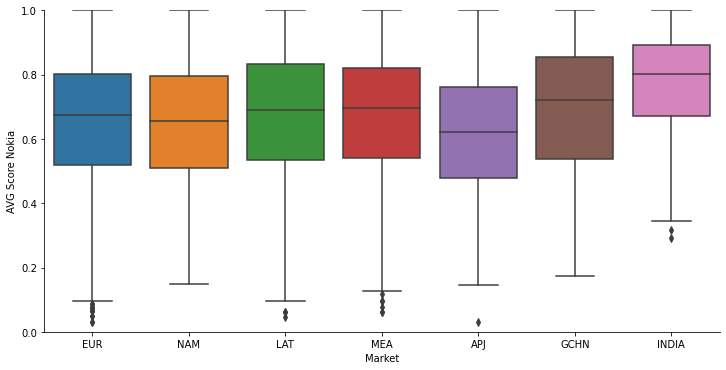

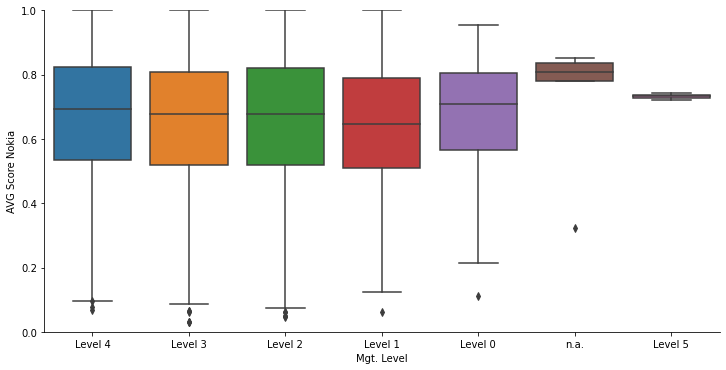

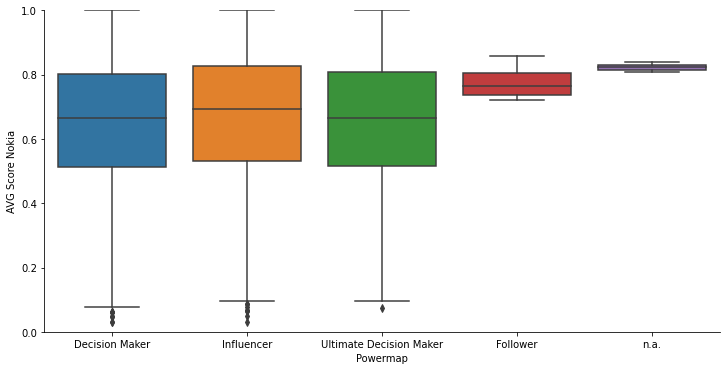

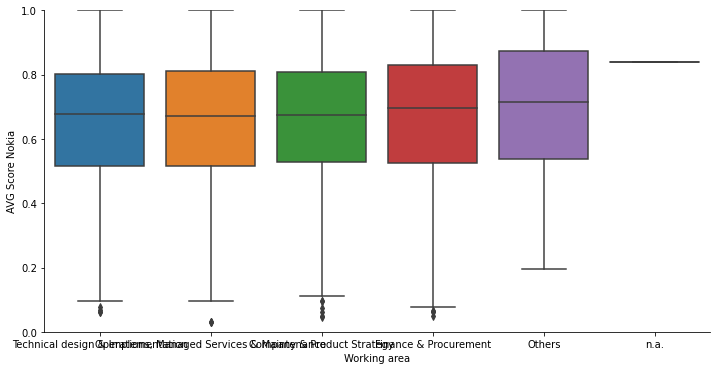

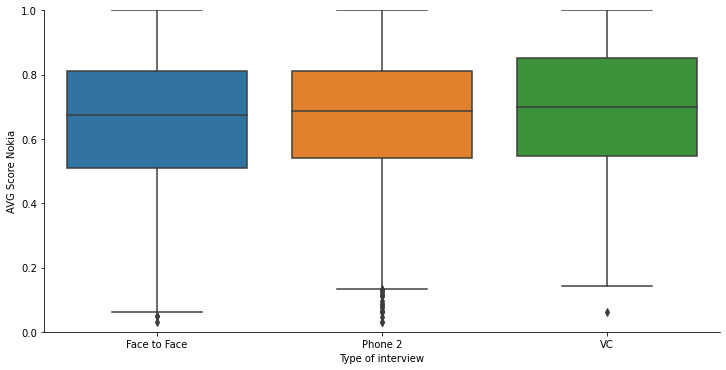

In [54]:
# Generate categorical plots for features
for col in ['Market', 'Mgt. Level', 'Powermap', 'Working area', 'Type of interview']:
    sns.catplot(x=col, y='AVG Score Nokia', data=CPVi, kind='box', aspect=2, )
    plt.ylim(0, 1)

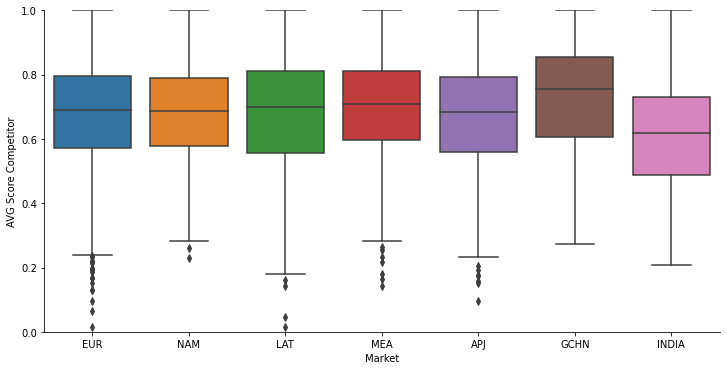

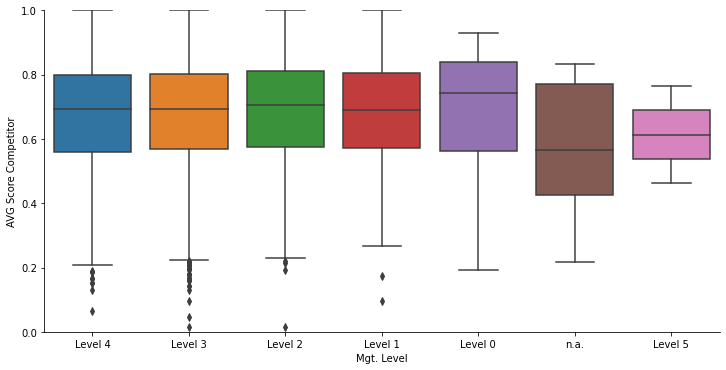

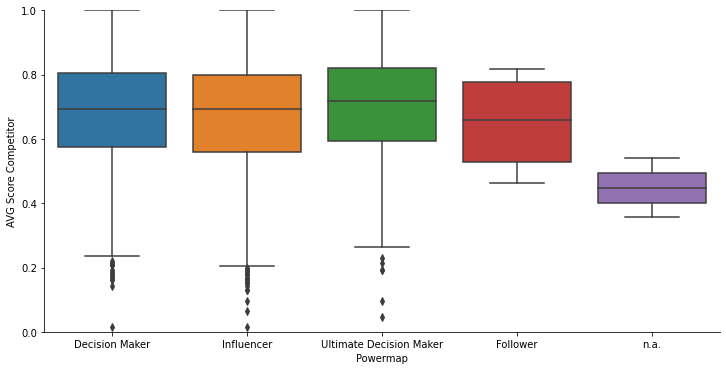

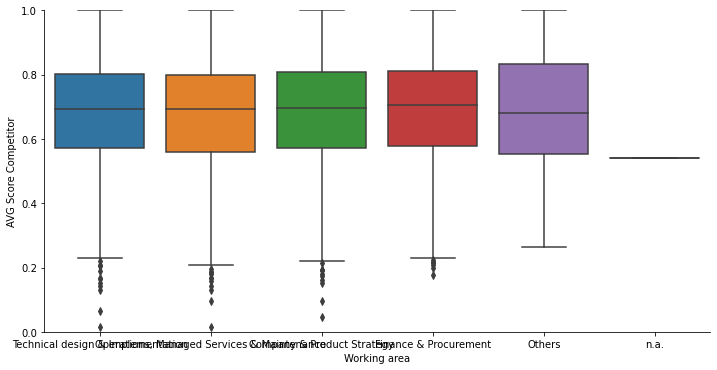

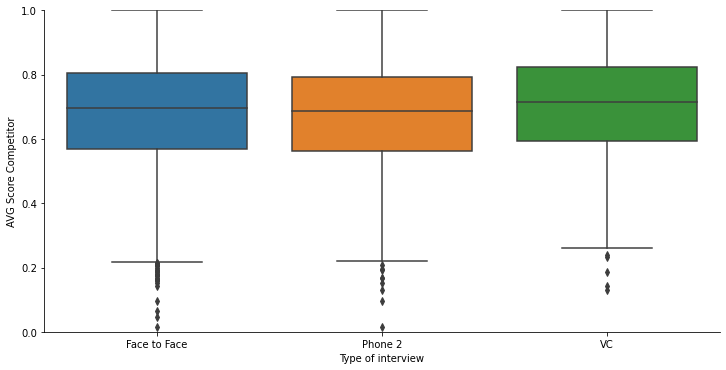

In [55]:
# Generate categorical plots for features
for col in ['Market', 'Mgt. Level', 'Powermap', 'Working area', 'Type of interview']:
    sns.catplot(x=col, y='AVG Score Competitor', data=CPVi, kind='box', aspect=2, )
    plt.ylim(0, 1)

## 12. Implement a ML Clustering Algorithm: KMeans & PCA (Principal Component Analysis)
https://en.wikipedia.org/wiki/K-means_clustering

### 12.1 Scalling data in order to get:
- Standard Deviation = 1
- Mean = 0

In [56]:
features_n=['CPV Nokia','CPV Nokia Experience', 'CPV Nokia Expectation', 'CPV Competitor', 'CPV Competitor Experience', 'CPV Competitor Expectation',
       'Value perception Nokia', 'Overall satisfaction Nokia','Strategic fit with Nokia', 'Recommendation Nokia',
       'Value perception competitor', 'Overall satisfaction competitor','Strategic fit with competitor', 'Recommendation competitor']

In [57]:
CPVi_scaled=CPVi[features_n].to_numpy()
print(CPVi_scaled.shape)
print('')
print(CPVi_scaled.round(2))

(7708, 14)

[[0.   0.   0.01 ... 0.56 0.67 0.56]
 [0.   0.   0.   ... 0.78 0.78 0.89]
 [0.27 0.41 0.13 ... 0.67 0.67 0.67]
 ...
 [0.87 0.73 1.   ... 0.78 0.67 0.78]
 [0.98 0.96 1.   ... 0.89 0.89 1.  ]
 [0.99 0.99 1.   ... 0.67 0.56 0.67]]


In [58]:
scaler = StandardScaler()
CPVi_scaled = scaler.fit_transform(CPVi_scaled)
print('Standard Deviation: '+ str(CPVi_scaled[:, 0].std().round(2)) )
print('Mean: '+ str(CPVi_scaled[:, 0].mean().round(2)))
print('Min: '+ str(CPVi_scaled.min().round(2)))
print('Max: '+ str(CPVi_scaled.max().round(2)))

Standard Deviation: 1.0
Mean: 0.0
Min: -5.99
Max: 2.06


In [59]:
CPVi_scaled

array([[-1.97256668, -1.94189449, -1.76458963, ..., -1.48102152,
        -0.62370031, -1.2761274 ],
       [-1.98990271, -1.94506831, -1.79241428, ...,  0.29115456,
         0.19550719,  0.9720346 ],
       [-1.03712858, -0.50062454, -1.38911319, ..., -0.59493348,
        -0.62370031, -0.52674007],
       ...,
       [ 1.07751344,  0.6437163 ,  1.3339507 , ...,  0.29115456,
        -0.62370031,  0.22264726],
       [ 1.47022762,  1.42624089,  1.3339507 , ...,  1.1772426 ,
         1.01471469,  1.72142193],
       [ 1.52931164,  1.54402513,  1.3339507 , ..., -0.59493348,
        -1.4429078 , -0.52674007]])

### 12.2 Find optimal number of cluster using: ELBOW METHOD
https://en.wikipedia.org/wiki/Elbow_method_(clustering)

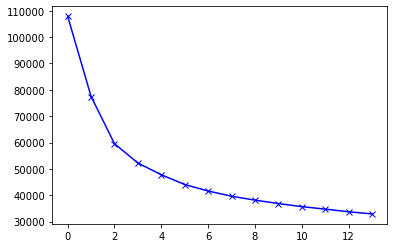

In [60]:
scores = []

for i in range(1,15):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(CPVi_scaled)
    scores.append(kmeans.inertia_)
    
plt.plot(scores, 'bx-')

In [61]:
kmeans = KMeans(3)
kmeans.fit(CPVi_scaled)
labels = kmeans.labels_

In [62]:
kmeans.cluster_centers_.shape

(3, 14)

In [63]:
CPVi_scaled_df = pd.DataFrame(CPVi_scaled, columns=['CPV Nokia',
       'CPV Nokia Experience', 'CPV Nokia Expectation', 'CPV Competitor',
       'CPV Competitor Experience', 'CPV Competitor Expectation',
       'Value perception Nokia', 'Overall satisfaction Nokia',
       'Strategic fit with Nokia', 'Recommendation Nokia',
       'Value perception competitor', 'Overall satisfaction competitor',
       'Strategic fit with competitor', 'Recommendation competitor'])

In [64]:
cluster_centers = pd.DataFrame(data = kmeans.cluster_centers_, columns = [CPVi_scaled_df.columns])
cluster_centers

,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor
0,0.365639,0.326989,0.356310,-1.167661,-1.082727,-1.075007,0.262471,0.311282,0.291840,0.328437,-0.880260,-0.934754,-0.865993,-0.894504
1,-1.124274,-1.036576,-1.067995,0.022851,0.029263,0.013537,-0.912248,-0.956232,-0.885993,-0.980470,-0.087490,-0.053502,0.008496,-0.095697
2,0.631838,0.588718,0.594745,0.693493,0.636913,0.644165,0.533508,0.537219,0.495675,0.545196,0.602384,0.609729,0.520750,0.617293


In [65]:
cluster_centers = scaler.inverse_transform(cluster_centers)
cluster_centers = pd.DataFrame(data = cluster_centers, columns = [CPVi_scaled_df.columns])
cluster_centers

,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor
0,0.665790,0.644286,0.687291,0.289311,0.291044,0.295957,0.773372,0.775406,0.762615,0.807698,0.639313,0.627814,0.637466,0.616017
1,0.244668,0.257621,0.231713,0.591600,0.587316,0.596180,0.598184,0.587938,0.569054,0.575212,0.740457,0.737214,0.754889,0.733271
2,0.741030,0.718504,0.763558,0.761886,0.749214,0.770108,0.813792,0.808823,0.796112,0.846199,0.828473,0.819548,0.823672,0.837929


In [66]:
labels.shape # Labels associated to each data point

(7708,)

In [67]:
labels.max()

2

In [68]:
labels.min()

0

In [69]:
y_kmeans = kmeans.fit_predict(CPVi_scaled)
y_kmeans

array([1, 1, 1, ..., 2, 0, 2])

In [70]:
# concatenate the clusters labels to our original dataframe
CPVi_cluster = pd.concat([CPVi[['CPV Nokia','CPV Nokia Experience', 'CPV Nokia Expectation', 'CPV Competitor',
       'CPV Competitor Experience', 'CPV Competitor Expectation','Value perception Nokia', 'Overall satisfaction Nokia',
       'Strategic fit with Nokia', 'Recommendation Nokia','Value perception competitor', 'Overall satisfaction competitor',
       'Strategic fit with competitor', 'Recommendation competitor']], pd.DataFrame({'cluster':labels})], axis = 1)
CPVi_cluster

,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,cluster
0,0.0049,0.0009,0.0089,0.2141,0.1401,0.2882,0.22,0.33,0.33,0.0,0.56,0.56,0.67,0.56,1
1,0.0000,0.0000,0.0000,0.8086,0.6866,0.9305,0.11,0.11,0.00,0.0,0.78,0.78,0.78,0.89,1
2,0.2693,0.4096,0.1290,0.6661,0.6661,0.6661,0.67,0.33,0.44,0.0,0.67,0.67,0.67,0.67,1
3,0.0930,0.0973,0.0887,0.8375,0.8375,0.8375,0.33,0.33,0.33,0.0,0.78,0.78,0.78,0.78,1
4,0.0360,0.0000,0.0721,0.9667,0.9334,1.0000,0.00,0.33,0.33,0.0,0.89,0.89,0.89,1.00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7703,1.0000,1.0000,1.0000,0.5922,0.5264,0.6579,0.89,1.00,0.78,1.0,0.89,0.56,0.78,0.78,2
7704,0.8272,0.6543,1.0000,0.9627,0.9253,1.0000,0.78,0.78,0.78,1.0,0.78,0.89,0.89,1.00,2
7705,0.8670,0.7341,1.0000,0.2310,0.3060,0.1560,1.00,0.89,0.89,1.0,0.78,0.78,0.67,0.78,0
7706,0.9780,0.9560,1.0000,0.9780,0.9560,1.0000,0.78,0.89,0.89,1.0,0.78,0.89,0.89,1.00,2


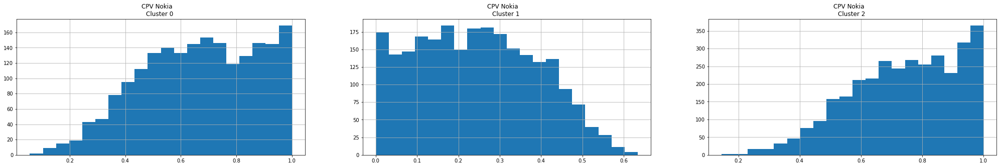

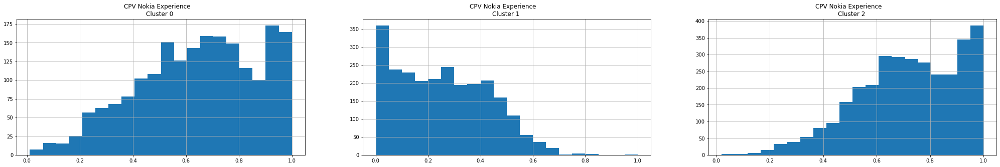

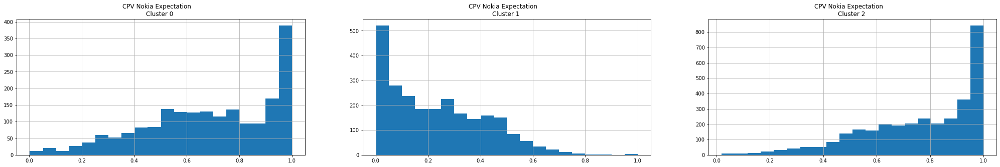

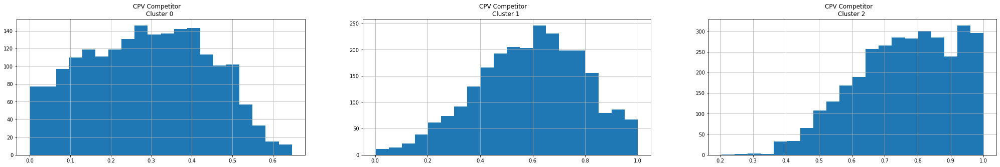

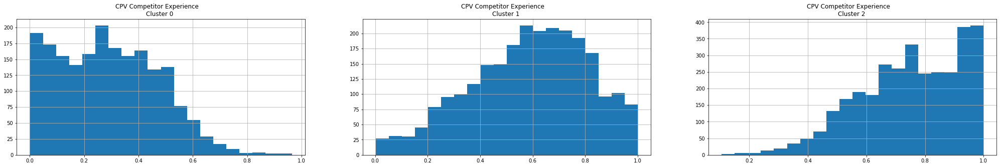

...

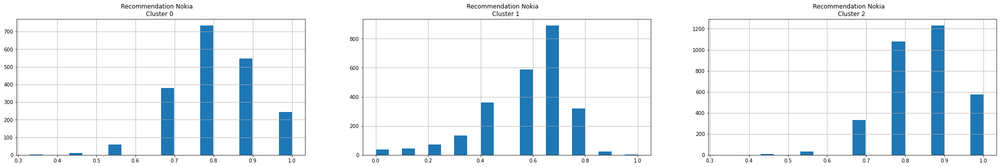

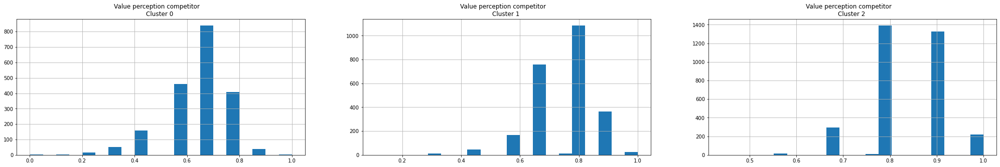

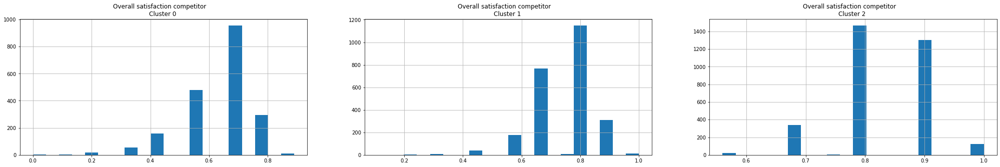

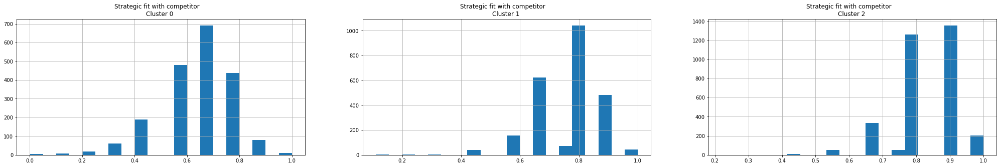

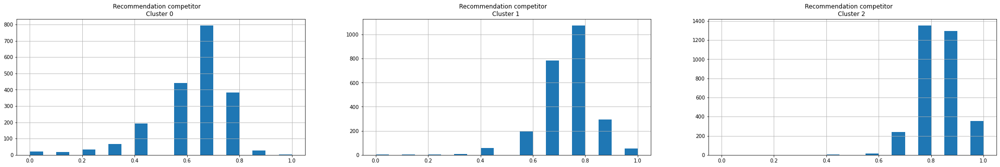

In [71]:
# Plot the histogram of various clusters
for i in CPVi_scaled_df.columns:
  plt.figure(figsize = (35, 5))
  for j in range(3):
    plt.subplot(1,3,j+1)
    cluster = CPVi_cluster[CPVi_cluster['cluster'] == j]
    cluster[i].hist(bins = 20)
    plt.title('{}    \nCluster {} '.format(i,j))
  
  plt.show()

### 12.3 Principal Component Analysis
https://en.wikipedia.org/wiki/Principal_component_analysis

In [72]:
# Obtain the principal components 
pca = PCA(n_components=2)
principal_comp = pca.fit_transform(CPVi_scaled)
principal_comp

array([[ 7.56887803, -1.64297491],
       [ 5.58888482, -6.5307737 ],
       [ 3.84599965, -2.50023504],
       ...,
       [-1.57532309,  3.26633491],
       [-4.41292004, -0.60386149],
       [-1.08267679,  3.68708039]])

In [73]:
print('Standard Deviation: '+ str(principal_comp[:, 0].std()) )
print('Mean: '+ str(principal_comp[:, 0].mean()))
print('Min: '+ str(principal_comp.min()))
print('Max: '+ str(principal_comp.max()))

Standard Deviation: 2.4715125981998614
Mean: 0.0
Min: -7.302761141883491
Max: 12.376260671918818


In [74]:
# Create a dataframe with the two components
pca_df = pd.DataFrame(data = principal_comp, columns =['pca1','pca2'])
pca_df.head()

,pca1,pca2
0,7.568878,-1.642975
1,5.588885,-6.530774
2,3.846000,-2.500235
3,3.991017,-5.117713
4,3.484365,-7.302761


In [75]:
# Concatenate the clusters labels to the dataframe
pca_df = pd.concat([pca_df,pd.DataFrame({'cluster':labels})], axis = 1)
pca_df.head()

,pca1,pca2,cluster
0,7.568878,-1.642975,1
1,5.588885,-6.530774,1
2,3.846000,-2.500235,1
3,3.991017,-5.117713,1
4,3.484365,-7.302761,1


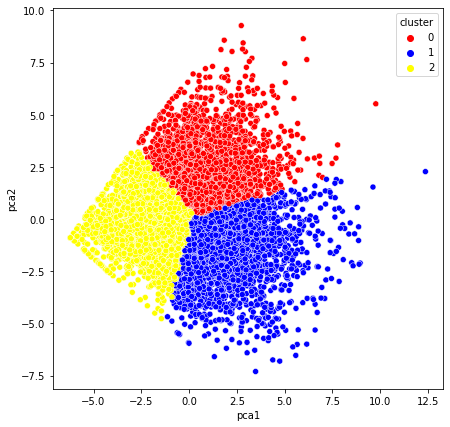

In [76]:
plt.figure(figsize=(7,7))
ax = sns.scatterplot(x="pca1", y="pca2", hue = "cluster", data = pca_df, palette =['red','blue','yellow'])
plt.show()

In [77]:
CPVi_with_cluster = pd.concat([CPVi, CPVi_cluster['cluster']], axis=1, join="inner")
CPVi_with_cluster.sample(5)

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date,Year,AVG Score Nokia,AVG Score Competitor,cluster
7338,84417,IDEA,INDIA,INDIA VFI,INDIA VFI CBT,n.a.,India,Face to Face,Level 2,n.a.,Influencer,"Operations, Managed Services & Maintenance","COO, Andhra Pradesh",Huawei,0.9515,0.9029,1.0000,0.7203,0.7571,0.6835,0.78,0.89,0.89,1.00,0.67,0.89,0.89,0.78,2017-06-01,301002201,2017-04-26,2017,0.916343,0.770129,2
5377,21863,Telefonica Colombia,LAT,LAT NORTHERN CONE,LAT NORTHERN CONE CBT,Telefonica,Colombia,Face to Face,Level 2,n.a.,Ultimate Decision Maker,Technical design & Implementation,CTO,Huawei,0.5827,0.5123,0.6531,0.3279,0.3849,0.2709,0.78,0.78,0.67,0.89,0.78,0.67,0.67,0.78,2018-11-06,301000420,2018-10-11,2018,0.695443,0.554814,0
6423,83098,Avantel,LAT,LAT NORTHERN CONE,LAT NORTHERN CONE CBT,n.a.,Colombia,Face to Face,Level 4,n.a.,Influencer,Finance & Procurement,Treasury Coordinator,Oracle,0.6619,0.6619,0.6619,0.0204,0.0330,0.0077,0.78,0.89,0.78,0.89,0.44,0.56,0.33,0.33,2015-08-20,301001448,2017-08-10,2017,0.760814,0.245871,0
5515,77952,CMCC Jiangxi,GCHN,GCHN CMCC,GCHN CMCC CBT,CMCC,China,Face to Face,Level 3,n.a.,Influencer,Technical design & Implementation,VGM of DI Department,Huawei,0.8014,0.8596,0.7432,0.8596,0.8596,0.8596,0.89,0.89,0.78,0.89,0.89,0.89,0.89,0.89,2012-04-17,301000064,2019-03-28,2019,0.836314,0.876971,2
2390,71991,Vodafone Global,EUR,EUR VF,EUR VF CBT GLOBAL,Vodafone,United Kingdom,Face to Face,Level 2,n.a.,Decision Maker,Company & Product Strategy,Head of Business Products & Service Unit,Huawei,0.2957,0.1968,0.3946,0.6955,0.6031,0.7878,0.56,0.67,0.67,0.67,0.67,0.78,0.89,0.78,2011-06-04,301001368,2020-05-09,2020,0.493871,0.743771,1


In [78]:
print(CPVi_with_cluster[['CPV Nokia',
       'CPV Nokia Experience', 'CPV Nokia Expectation', 'CPV Competitor','CPV Competitor Experience', 'CPV Competitor Expectation',
       'Value perception Nokia', 'Overall satisfaction Nokia','Strategic fit with Nokia', 'Recommendation Nokia','Value perception competitor', 'Overall satisfaction competitor',
       'Strategic fit with competitor', 'Recommendation competitor','AVG Score Nokia','AVG Score Competitor', 'cluster']].groupby('cluster').mean().applymap(lambda x: f"{x:0.2f}").transpose())
print('')
print(CPVi_with_cluster['cluster'].value_counts())

cluster                             0     1     2
CPV Nokia                        0.67  0.24  0.74
CPV Nokia Experience             0.64  0.26  0.72
CPV Nokia Expectation            0.69  0.23  0.76
CPV Competitor                   0.29  0.59  0.76
CPV Competitor Experience        0.29  0.59  0.75
CPV Competitor Expectation       0.30  0.60  0.77
Value perception Nokia           0.77  0.60  0.81
Overall satisfaction Nokia       0.78  0.59  0.81
Strategic fit with Nokia         0.76  0.57  0.80
Recommendation Nokia             0.81  0.58  0.85
Value perception competitor      0.64  0.74  0.83
Overall satisfaction competitor  0.63  0.74  0.82
Strategic fit with competitor    0.64  0.75  0.82
Recommendation competitor        0.62  0.73  0.84
AVG Score Nokia                  0.73  0.44  0.78
AVG Score Competitor             0.49  0.68  0.80

2    3257
1    2473
0    1978
Name: cluster, dtype: int64


# BACKUP

## BACKUP #1: CPVi DATASET FULL PROFILE

In [80]:
report = ProfileReport(CPVi)
report.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]